<a href="https://colab.research.google.com/github/saleemhamo/computer_vision_text_line_segmentation/blob/main/Approach_1_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Text-Line Extraction for Arabic Handwritten Documents**

# Imports


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
# drive.flush_and_unmount()

Mounted at /content/drive


In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

#Reading Data


In [ ]:
data_path = '/content/drive/MyDrive/Dataset/ahte_dataset'
# image = cv2.imread(data_path + '/ahte_test_binary_images/book1_page11.png')

image = cv.imread('/content/drive/MyDrive/120 - 2nd Semester/Computer Vision/Project #1/Dataset/ahte_dataset/ahte_test_binary_images/book1_page11.png', cv.IMREAD_GRAYSCALE)
# image = cv.imread('/content/drive/MyDrive/Dataset/ahte_dataset/ahte_test_binary_images/book1_page11.png', cv.IMREAD_GRAYSCALE)
# cv2_imshow(image)
# ret, image = cv.threshold(image, 0, 255, cv.THRESH_BINARY_INV)
ret, image = cv.threshold(image, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)



# Preprocessing

Original Image

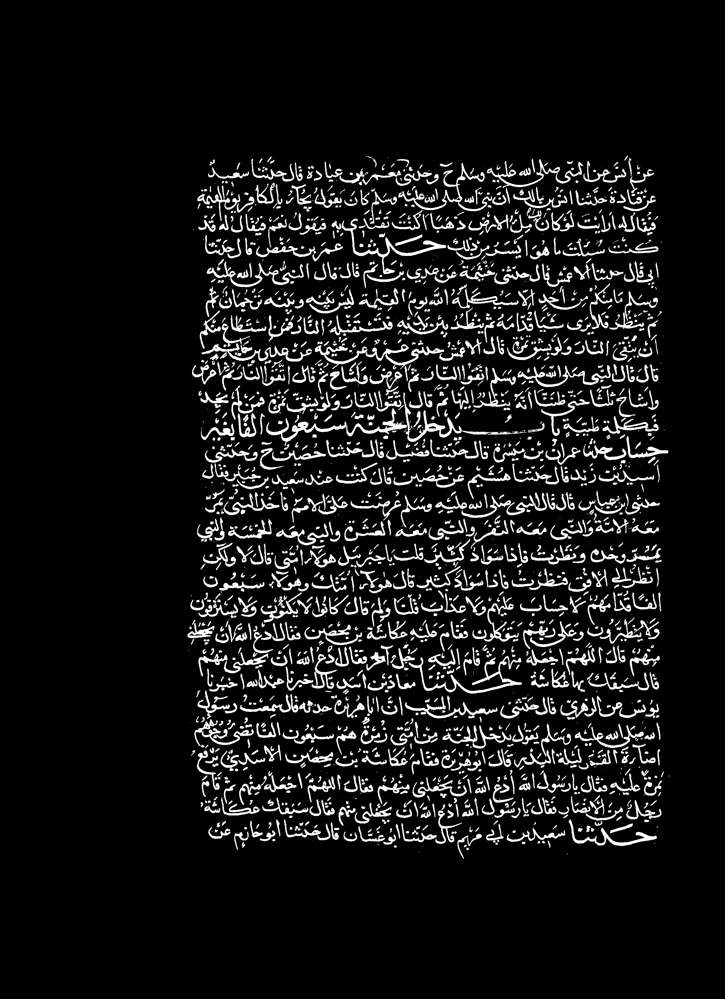

In [ ]:
cv2_imshow(image)


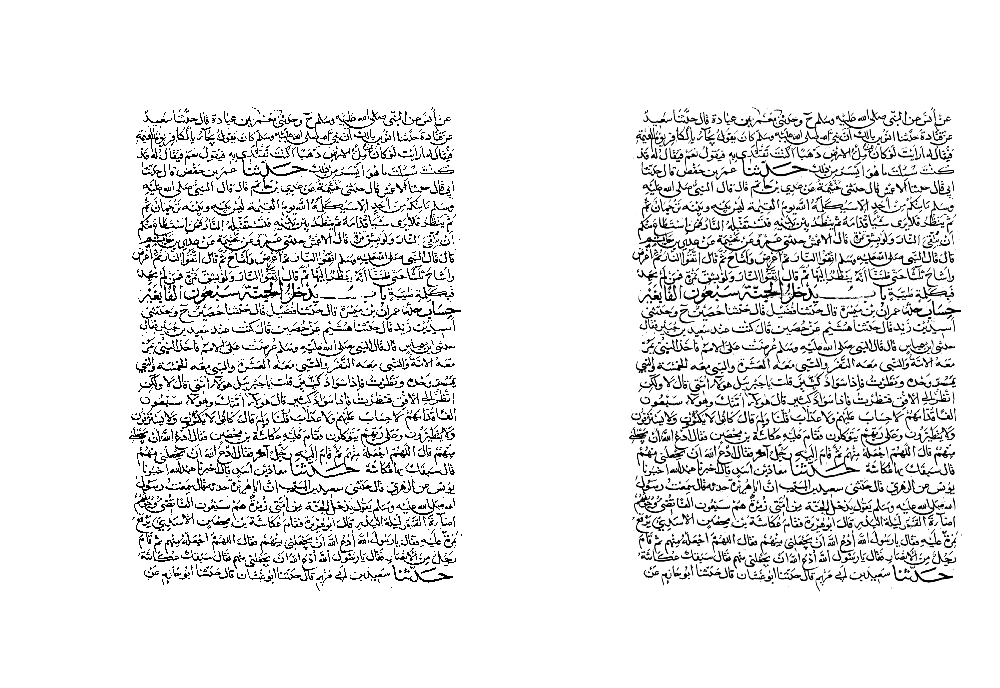

In [ ]:
# kernel = np.ones((5,5),np.float32)/25
# dst = cv2.filter2D(image,-1,kernel)


blur = cv2.GaussianBlur(image,(5,5),0)
# cv2_imshow(blur)


final_frame = cv2.hconcat((image, blur))
cv2_imshow(final_frame)

# plt.subplot(2, 1, 1), cv2_imshow(image)
# plt.subplot(1, 2, 2), cv2_imshow(blur)
# # plt.savefig('final_image_name.extension') # To save figure
# plt.show() # To show figure


# plt.subplot(121),plt.imshow(image),plt.title('Original')
# plt.xticks([]), plt.yticks([])
# plt.subplot(122),plt.imshow(blur),plt.title('Blur')
# plt.xticks([]), plt.yticks([])
# plt.show()

Binary threasholding

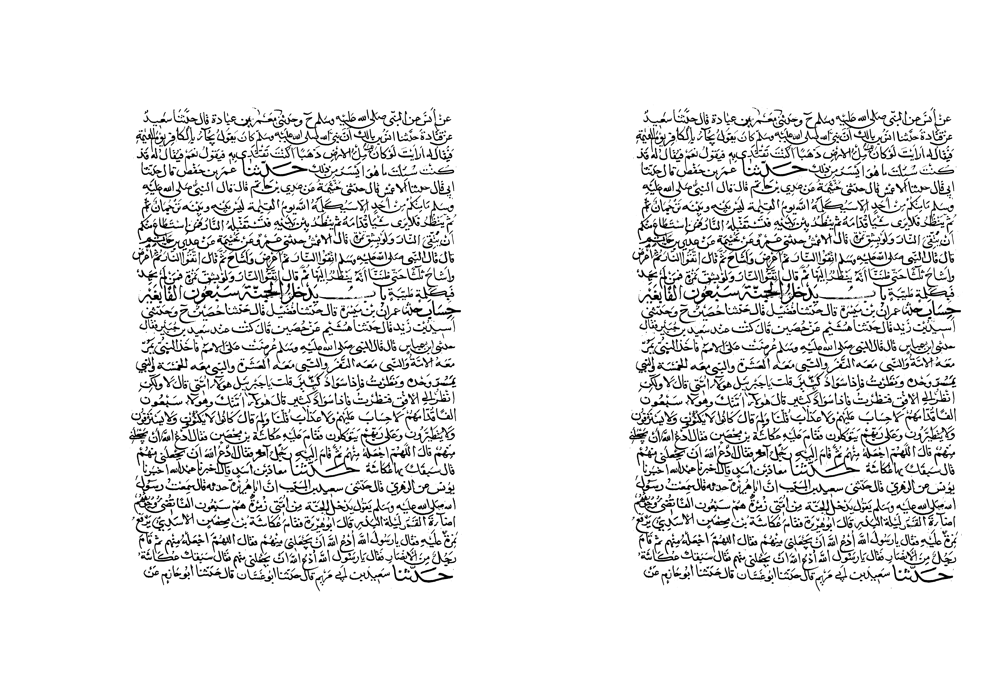

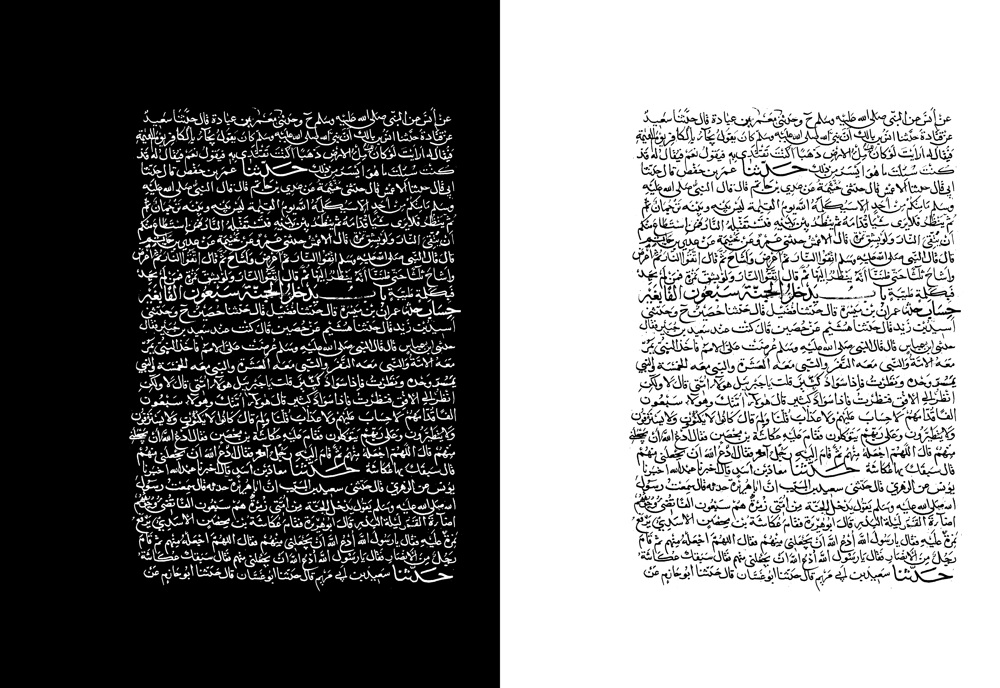

In [ ]:
ret, thresh1 = cv2.threshold(blur, 120, 255, cv2.THRESH_BINARY)
final_frame = cv2.hconcat((thresh1, image))
cv2_imshow(final_frame)

ret2, thresh2 = cv2.threshold(blur, 120, 255, cv2.THRESH_BINARY_INV)
final_frame = cv2.hconcat((thresh2, image))
cv2_imshow(final_frame)



Erusion

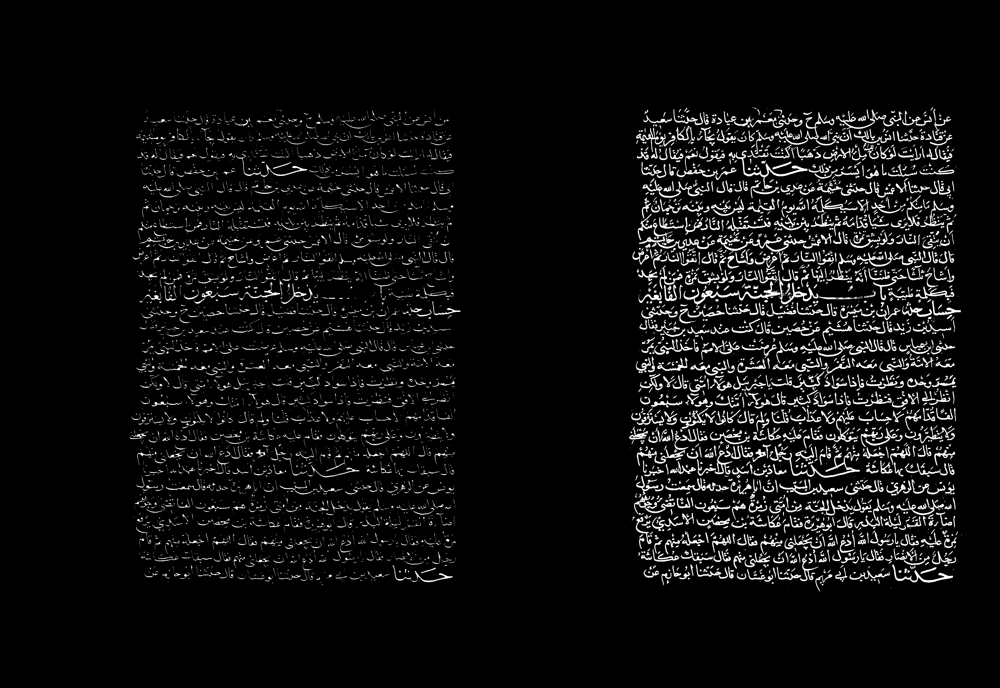

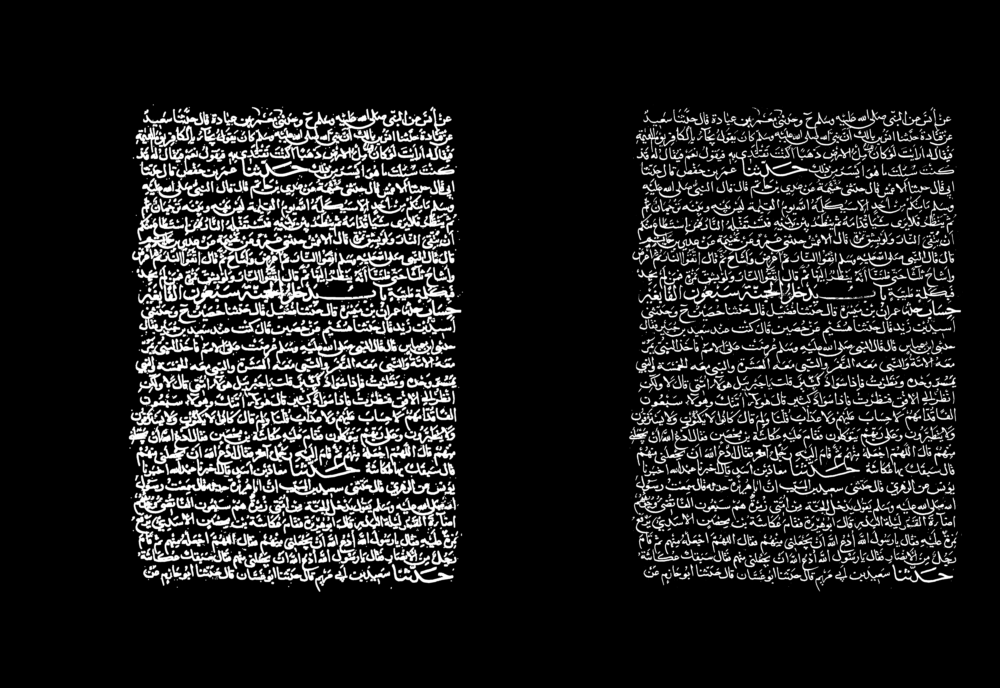

In [ ]:
kernel = np.ones((5, 5), np.uint8)
eruded = cv.erode(image, kernel, iterations=1) 
final_frame = cv.hconcat((eruded, image))
cv2_imshow(final_frame)
dilated = cv.dilate(image, kernel, iterations=1) 
final_frame = cv.hconcat((dilated, image))
cv2_imshow(final_frame)

Thinning

In [ ]:
thinned = cv2.ximgproc.thinning(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))
final_frame = cv2.hconcat((thinned, image))
cv2_imshow(final_frame)

error: ignored

In [ ]:
img1 = image.copy()

# Structuring Element
kernel = cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3))
# Create an empty output image to hold values

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY )

thin = np.zeros(img1.shape,dtype='uint8')

# Loop until erosion leads to an empty set
while (cv2.countNonZero(img1) != 0):
  # Erosion
  erode = cv2.erode(img1,kernel)
  # Opening on eroded image
  opening = cv2.morphologyEx(erode,cv2.MORPH_OPEN,kernel)
  # Subtract these two
  subset = erode - opening
  # Union of all previous sets
  thin = cv2.bitwise_or(subset,thin)
  # Set the eroded image for next iteration
  img1 = erode.copy()
    
final_frame = cv2.hconcat((thin, img1))
cv2_imshow(final_frame)

Horizontal Projection

In [ ]:
img = dilated.copy()

img_org = dilated.copy()

# calculating object histogram
roihist = cv2.calcHist([img],[0, 1], None, [180, 256], [0, 180, 0, 256] )
# normalize histogram and apply backprojection
cv2.normalize(roihist,roihist,0,255,cv2.NORM_MINMAX)
dst = cv2.calcBackProject([img],[0,1],roihist,[0,180,0,256],1)
# Now convolute with circular disc
disc = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
cv2.filter2D(dst,-1,disc,dst)
# threshold and binary AND
ret,thresh = cv2.threshold(dst,50,255,0)
thresh = cv2.merge((thresh,thresh,thresh))
res = cv2.bitwise_and(img,thresh)
res1 = np.vstack((img,thresh,res))
# cv.imwrite('res.jpg',res)

# cv2_imshow(res1)

final_frame = cv2.hconcat((res, img_org))
cv2_imshow(final_frame)


NameError: ignored

reusion


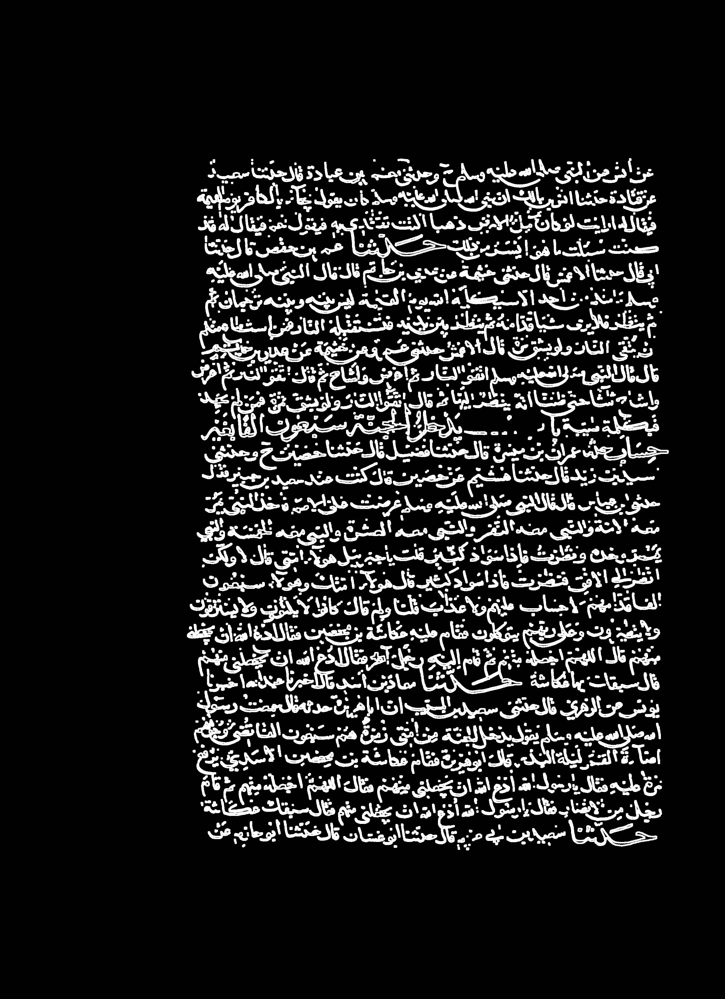

In [ ]:
kernel = np.ones((5, 5), np.uint8)
eruded = cv2.dilate(res, kernel, iterations=1) 

# final_frame = cv2.hconcat((eruded, image))
cv2_imshow(eruded)

Conert

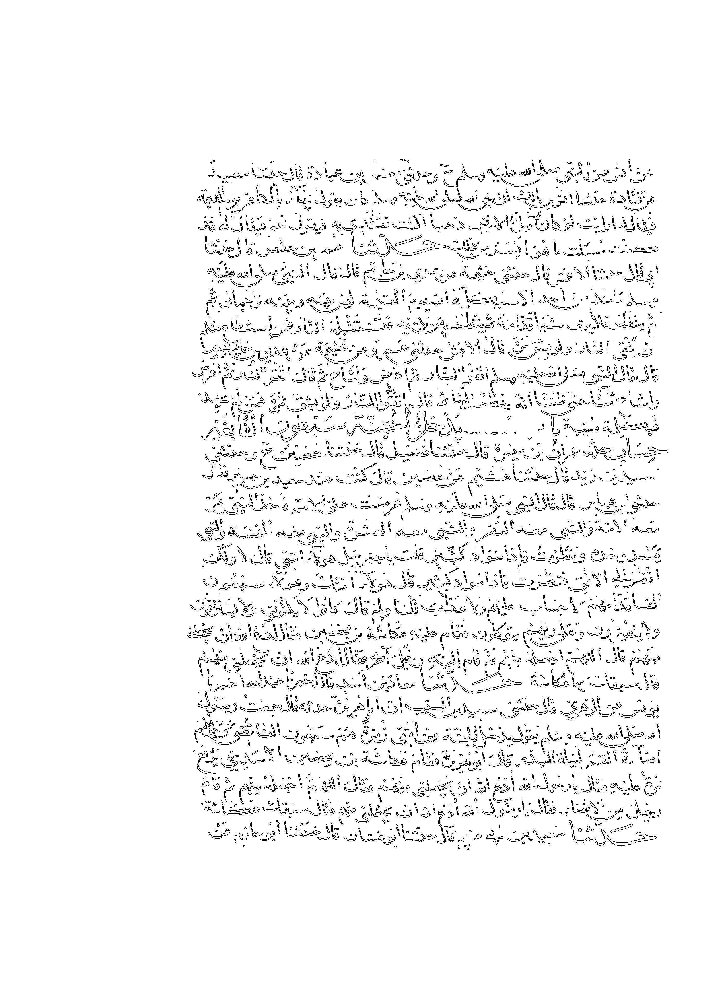

In [ ]:
ret2, thresh2 = cv2.threshold(res, 120, 255, cv2.THRESH_BINARY_INV)
# final_frame = cv2.hconcat((thresh2, image))
cv2_imshow(thresh2)

opening

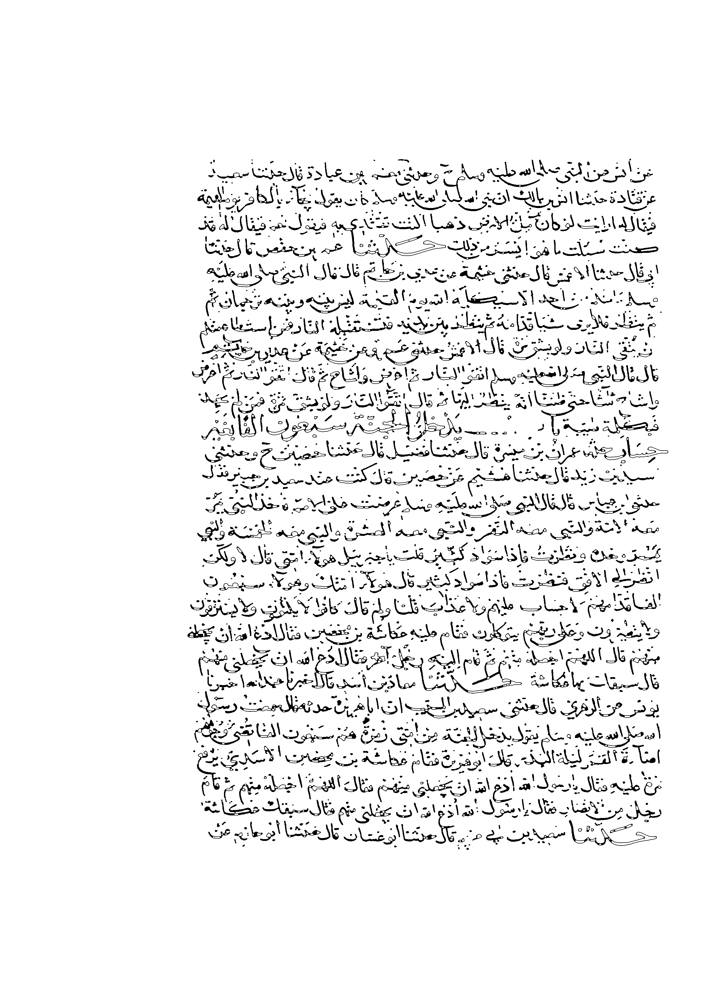

In [ ]:
opening = cv2.morphologyEx(thresh2, cv2.MORPH_OPEN, kernel)
opening = cv2.morphologyEx(opening, cv2.MORPH_OPEN, kernel)

cv2_imshow(opening)

Hole Filling

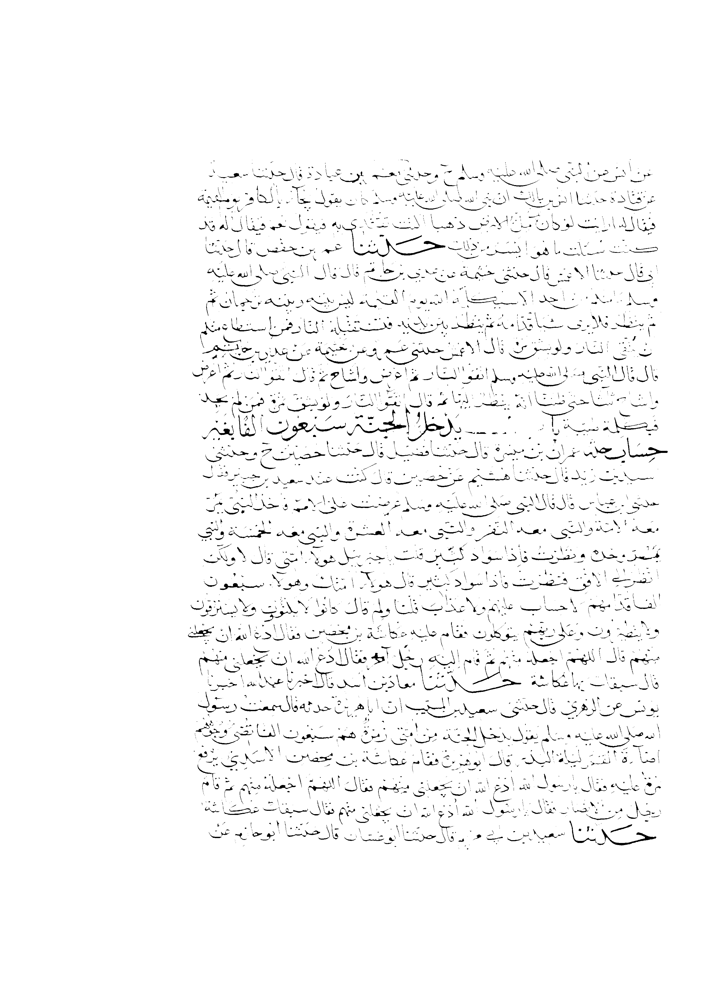

In [ ]:
th, im_th = cv2.threshold(img_org, 0, 255, cv2.THRESH_BINARY);
im_floodfill = im_th.copy()
# h, w = im_th.shape[:2]

# cv2.floodFill(im_floodfill, np.zeros((h+2, w+2), np.uint8), (0,0), 255);
# cv2_imshow(im_floodfill)

# im_floodfill_inv = cv2.bitwise_not(im_floodfill)
# im_out = im_th | im_floodfill_inv

for i in range(0, 10):
  im_floodfill = cv2.morphologyEx(im_floodfill, cv2.MORPH_OPEN, kernel)
  
cv2_imshow(im_floodfill)

# Pre 2

Best angle: 
-0.4999999999999978


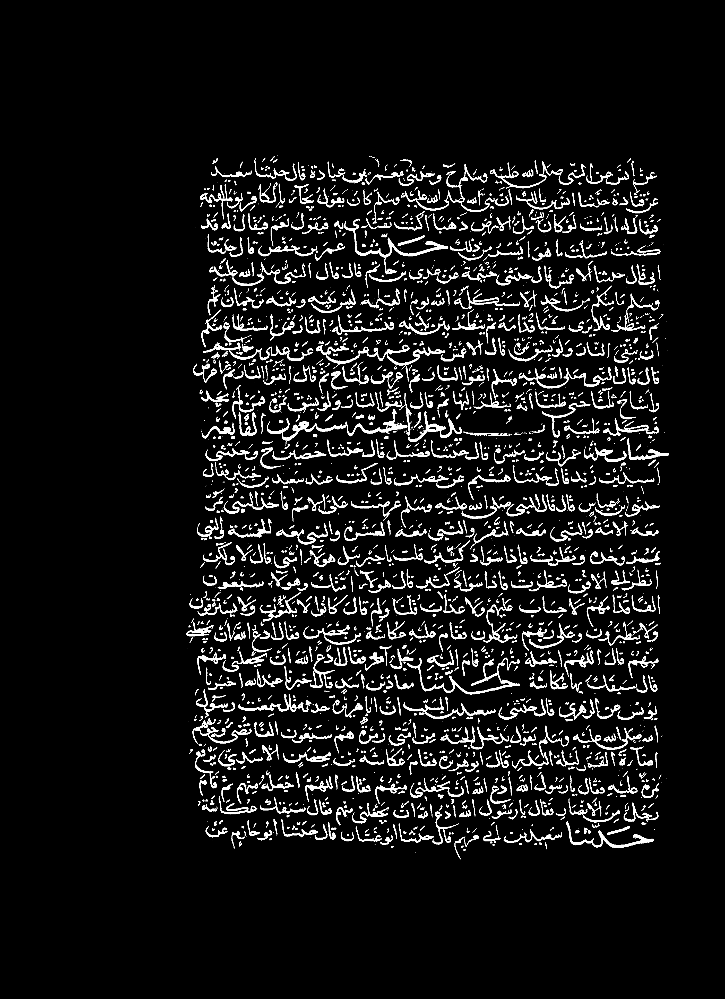

4
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
2738
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
from scipy.ndimage import interpolation as inter
from PIL import Image as im

# Line Segmentation
#----------------------------------------------------------------------------------------
def line_horizontal_projection(image, cut=3):

    # Preprocess input image
    clean_img = preprocess(image)

    # cv2_imshow(image)
    cv2_imshow(clean_img)

    # Segmentation    
    lines = projection_segmentation(clean_img, axis='horizontal', cut=cut)

    return lines




def projection_segmentation(clean_img, axis, cut=3):
    
    segments = []
    start = -1
    cnt = 0

    projection_bins = projection(clean_img, axis)
    for idx, projection_bin in enumerate(projection_bins):

        if projection_bin != 0:
            cnt = 0
        if projection_bin != 0 and start == -1:
            start = idx
        if projection_bin == 0 and start != -1:
            cnt += 1
            if cnt >= cut:
                if axis == 'horizontal':
                    segments.append(clean_img[max(start-1, 0):idx, :])
                elif axis == 'vertical':
                    segments.append(clean_img[:, max(start-1, 0):idx])
                cnt = 0
                start = -1
    
    return segments


def projection(gray_img, axis:str='horizontal'):
    """ Compute the horizontal or the vertical projection of a gray image """

    if axis == 'horizontal':
        projection_bins = np.sum(gray_img, 1).astype('int32')
    elif axis == 'vertical':
        projection_bins = np.sum(gray_img, 0).astype('int32')

    return projection_bins


def preprocess(image):

    # Maybe we end up using only gray level image.
    gray_img = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    gray_img = cv.bitwise_not(gray_img)

    binary_img = binary_otsus(gray_img, 0)
    # cv.imwrite('origin.png', gray_img)

    # deskewed_img = deskew(binary_img)
    deskewed_img = deskew(binary_img)
    # cv.imwrite('output.png', deskewed_img)

    # binary_img = binary_otsus(deskewed_img, 0)
    # breakpoint()

    # Visualize

    # breakpoint()
    return deskewed_img

def binary_otsus(image, filter:int=1):
    """Binarize an image 0's and 255's using Otsu's Binarization"""

    if len(image.shape) == 3:
        gray_img = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    else:
        gray_img = image

    # Otsus Binarization
    if filter != 0:
        blur = cv.GaussianBlur(gray_img, (3,3), 0)
        binary_img = cv.threshold(blur, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)[1]
    else:
        binary_img = cv.threshold(gray_img, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)[1]
    
    # Morphological Opening
    # kernel = np.ones((3,3),np.uint8)
    # clean_img = cv.morphologyEx(binary_img, cv.MORPH_OPEN, kernel)

    return binary_img


def deskew(binary_img):

    
    ht, wd = binary_img.shape
    # _, binary_img = cv.threshold(img, 127, 255, cv.THRESH_BINARY)

    # pix = np.array(img.convert('1').getdata(), np.uint8)
    bin_img = (binary_img // 255.0)

    delta = 0.1
    limit = 3
    angles = np.arange(-limit, limit+delta, delta)
    scores = []
    for angle in angles:
        hist, score = find_score(bin_img, angle)
        scores.append(score)

    best_score = max(scores)
    best_angle = angles[scores.index(best_score)]
    print('Best angle: ')
    print(best_angle)

    # correct skew
    data = inter.rotate(bin_img, best_angle, reshape=False, order=0)
    img = im.fromarray((255 * data).astype("uint8"))

    # img.save('skew_corrected.png')
    pix = np.array(img)
    return pix


def find_score(arr, angle):
    data = inter.rotate(arr, angle, reshape=False, order=0)
    hist = np.sum(data, axis=1)
    score = np.sum((hist[1:] - hist[:-1]) ** 2)
    return hist, score



lines = line_horizontal_projection(image)

print(len(lines[0]))
print(lines[0])



print(len(lines[1]))
print(lines[1])




# Pre 3

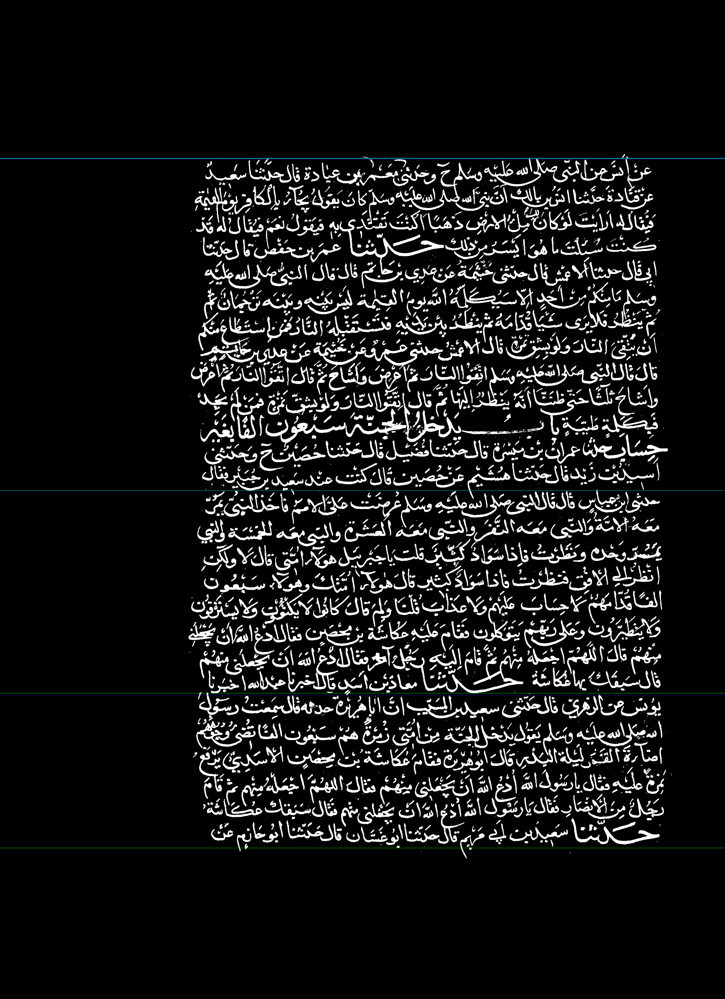

[612, 615, 618, 1906, 2701]


In [ ]:
import cv2

## (1) read
img = image
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

## (2) threshold
th, threshed = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV|cv2.THRESH_OTSU)

## (3) minAreaRect on the nozeros
pts = cv2.findNonZero(threshed)
ret = cv2.minAreaRect(pts)

(cx,cy), (w,h), ang = ret
if w>h:
    w,h = h,w
    ang += 90

## (4) Find rotated matrix, do rotation
M = cv2.getRotationMatrix2D((cx,cy), ang, 1.0)
rotated = cv2.warpAffine(threshed, M, (img.shape[1], img.shape[0]))

## (5) find and draw the upper and lower boundary of each lines
hist = cv2.reduce(rotated,1, cv2.REDUCE_AVG).reshape(-1)

th = 2
H,W = img.shape[:2]
uppers = [y for y in range(H-1) if hist[y]<=th and hist[y+1]>th]
lowers = [y for y in range(H-1) if hist[y]>th and hist[y+1]<=th]

rotated = cv2.cvtColor(rotated, cv2.COLOR_GRAY2BGR)
for y in uppers:
    cv2.line(rotated, (0,y), (W, y), (255,0,0), 1)

for y in lowers:
    cv2.line(rotated, (0,y), (W, y), (0,255,0), 1)

cv2_imshow(rotated)
# cv2.imwrite("result.png", rotated)

print(uppers)

# Pre 4

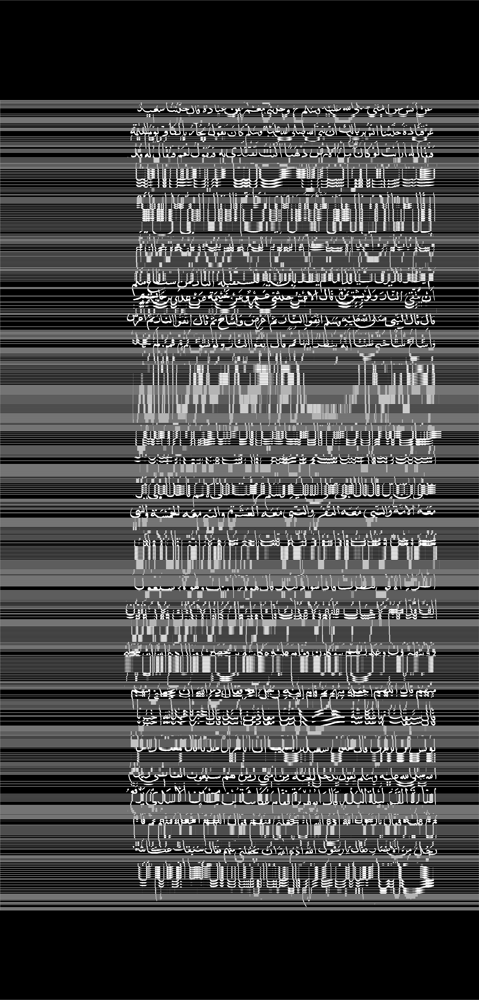

In [ ]:
# Load image, grayscale, blur, Otsu's threshold
# image = cv2.imread('1.png')
import cv2
from imutils import contours


ret2, thresh2 = cv2.threshold(image, 120, 255, cv2.THRESH_BINARY_INV)
# final_frame = cv2.hconcat((thresh2, image))
# cv2_imshow(final_frame)

original = thresh2.copy()
gray = cv2.cvtColor(thresh2, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (3,3), 0)
thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
invert = 255 - thresh  
height, width = thresh2.shape[:2]


# Dilate with a horizontal kernel to connect text contours
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (10,2))
dilate = cv2.dilate(thresh, kernel, iterations=2)


# Extract each line contour
lines = []
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
(cnts, _) = contours.sort_contours(cnts, method="top-to-bottom")
for c in cnts:
    x,y,w,h = cv2.boundingRect(c)
    cv2.rectangle(thresh2, (0, y), (width, y+h), (36,255,12), 2)
    line = original[y:y+h, 0:width]
    line = cv2.cvtColor(line, cv2.COLOR_BGR2GRAY)
    lines.append(line)


# Append white space in between each line
space = np.ones((1, width), dtype=np.uint8) * 255
result = np.zeros((0, width), dtype=np.uint8)
result = np.concatenate((result, space), axis=0)
for line in lines:
    result = np.concatenate((result, line), axis=0)
    result = np.concatenate((result, space), axis=0)


cv2_imshow(result)
# cv2_imshow(dilate)


# Seam Carving

AttributeError: ignored

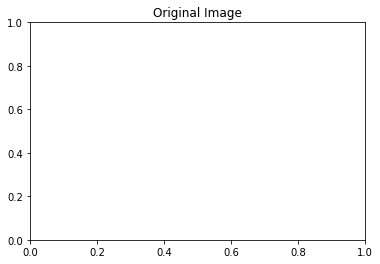

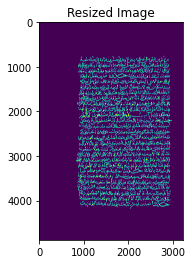

In [ ]:
from skimage import data, draw
from skimage import transform, util
import numpy as np
from skimage import filters, color
from matplotlib import pyplot as plt
import skimage.transform as transform


hl_color = np.array([0, 1, 0])

img = image
# img = data.rocket()
img = util.img_as_float(img)
eimg = filters.sobel(color.rgb2gray(img))

plt.title('Original Image')
# plt.imshow(img)

resized = transform.resize(img, (img.shape[0] + 1000, img.shape[1] + 400),
                           mode='reflect')
plt.figure()
plt.title('Resized Image')
plt.imshow(resized)
# cv2_imshow(resized)


out = transform.seam_carve(img, eimg, 'vertical', 200)
# plt.figure()
# plt.title('Resized using Seam Carving')
# plt.imshow(out)

# Example

In [ ]:
import sys

from tqdm import trange
import numpy as np
from imageio import imread, imwrite
from scipy.ndimage.filters import convolve

def calc_energy(img):
    filter_du = np.array([
        [1.0, 2.0, 1.0],
        [0.0, 0.0, 0.0],
        [-1.0, -2.0, -1.0],
    ])
    # This converts it from a 2D filter to a 3D filter, replicating the same
    # filter for each channel: R, G, B
    filter_du = np.stack([filter_du] * 3, axis=2)

    filter_dv = np.array([
        [1.0, 0.0, -1.0],
        [2.0, 0.0, -2.0],
        [1.0, 0.0, -1.0],
    ])
    # This converts it from a 2D filter to a 3D filter, replicating the same
    # filter for each channel: R, G, B
    filter_dv = np.stack([filter_dv] * 3, axis=2)

    img = img.astype('float32')
    convolved = np.absolute(convolve(img, filter_du)) + np.absolute(convolve(img, filter_dv))

    # We sum the energies in the red, green, and blue channels
    energy_map = convolved.sum(axis=2)

    return energy_map

def crop_c(img, scale_c):
    r, c, _ = img.shape
    new_c = int(scale_c * c)

    for i in trange(c - new_c):
        img = carve_column(img)

    return img

def crop_r(img, scale_r):
    img = np.rot90(img, 1, (0, 1))
    img = crop_c(img, scale_r)
    img = np.rot90(img, 3, (0, 1))
    return img

def carve_column(img):
    r, c, _ = img.shape

    M, backtrack = minimum_seam(img)
    mask = np.ones((r, c), dtype=np.bool)

    j = np.argmin(M[-1])
    for i in reversed(range(r)):
        mask[i, j] = False
        j = backtrack[i, j]

    mask = np.stack([mask] * 3, axis=2)
    img = img[mask].reshape((r, c - 1, 3))
    return img

def minimum_seam(img):
    r, c, _ = img.shape
    energy_map = calc_energy(img)

    M = energy_map.copy()
    backtrack = np.zeros_like(M, dtype=np.int)

    for i in range(1, r):
        for j in range(0, c):
            # Handle the left edge of the image, to ensure we don't index a -1
            if j == 0:
                idx = np.argmin(M[i-1, j:j + 2])
                backtrack[i, j] = idx + j
                min_energy = M[i-1, idx + j]
            else:
                idx = np.argmin(M[i - 1, j - 1:j + 2])
                backtrack[i, j] = idx + j - 1
                min_energy = M[i - 1, idx + j - 1]

            M[i, j] += min_energy

    return M, backtrack

def main():
    # if len(sys.argv) != 5:
    #     print('usage: carver.py <r/c> <scale> <image_in> <image_out>', file=sys.stderr)
    #     sys.exit(1)

    # which_axis = sys.argv[1]
    # scale = float(sys.argv[2])
    # in_filename = sys.argv[3]
    # out_filename = sys.argv[4]

    # img = imread(in_filename)
    img = image.copy()

    # if which_axis == 'r':
    out = crop_r(img, 0.5)
    # elif which_axis == 'c':
    # out = crop_c(img, 0.5)
    # else:
    #     print('usage: carver.py <r/c> <scale> <image_in> <image_out>', file=sys.stderr)
    #     sys.exit(1)
    
    cv2_imshow(out)

if __name__ == '__main__':
    main()




  0%|          | 0/1940 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

# Line

#binarize

read

Mounted at /content/drive


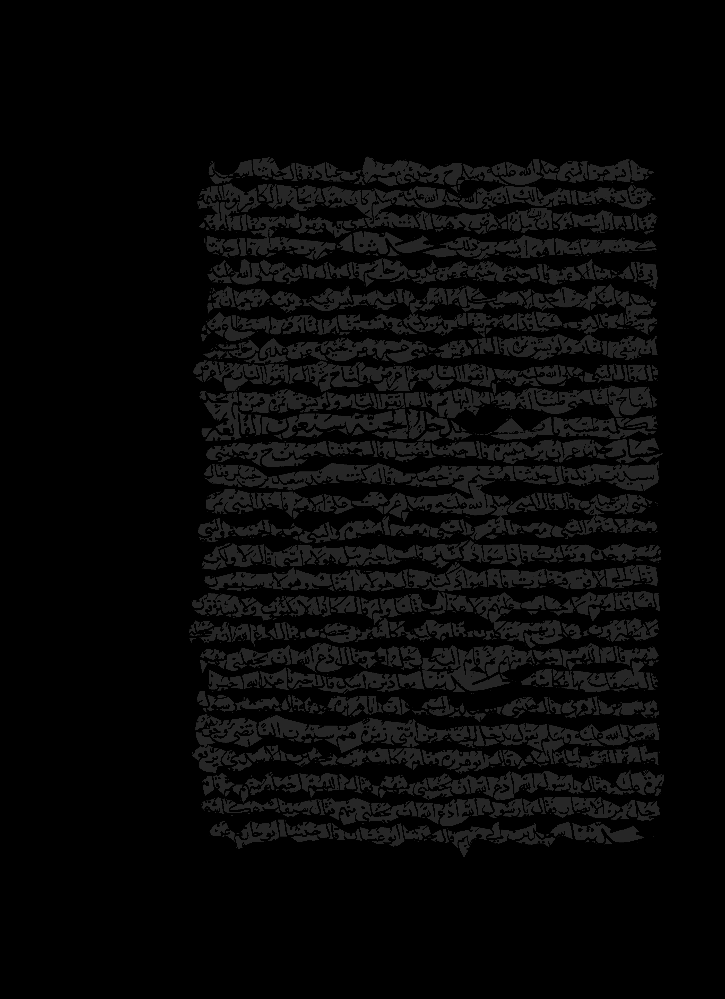

10


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
# drive.flush_and_unmount()

import os
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
data_path = '/content/drive/MyDrive/Dataset/ahte_dataset/ahte_test_diva_ground_image'

images1 = []

rootdir = data_path
for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        frame = cv.imread(os.path.join(subdir, file),cv.IMREAD_GRAYSCALE) 
        images1.append(frame)


cv2_imshow(images1[0])
print(len(images1))

thresholding 

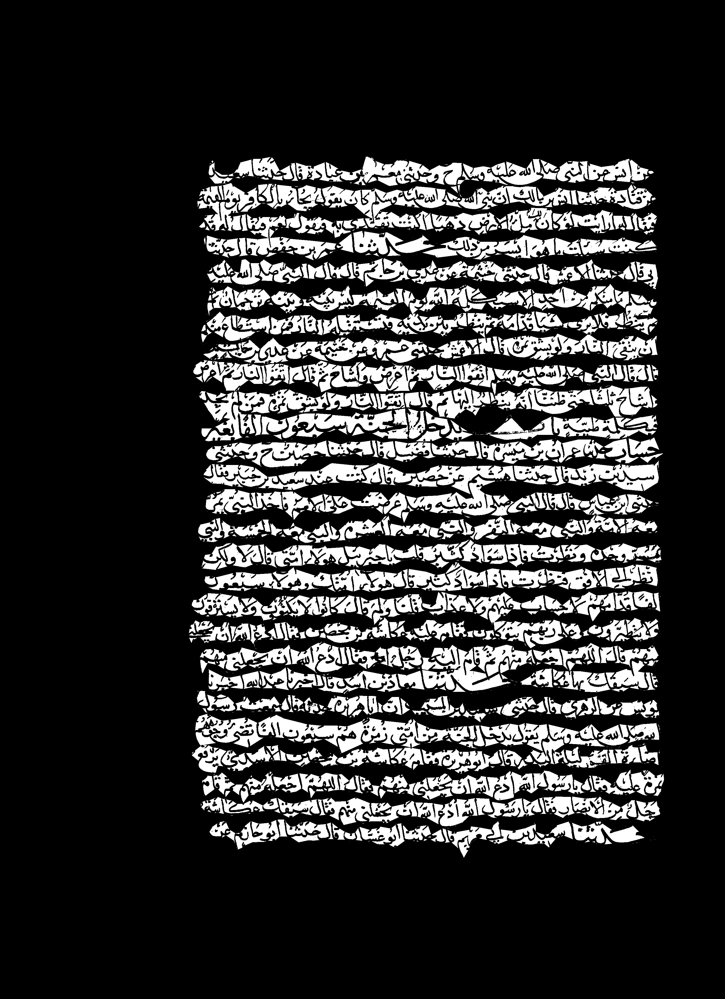

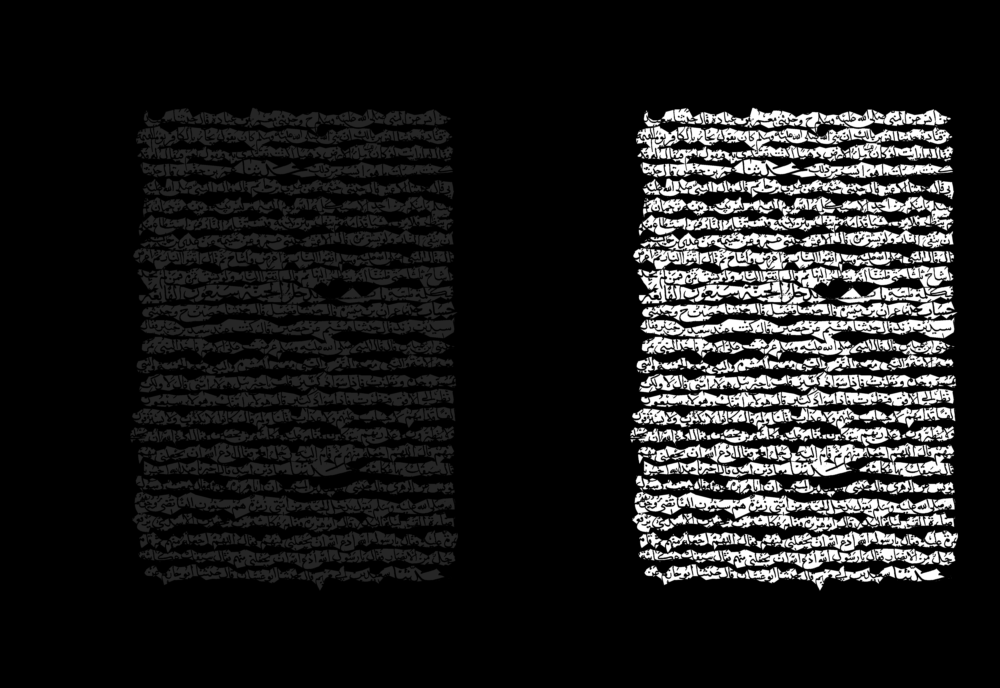

In [ ]:
ret, bw_img = cv.threshold(images1[0], 0, 255, cv.THRESH_BINARY)
cv2_imshow(bw_img)
final_frame = cv.hconcat((images1[0], bw_img))
cv2_imshow(final_frame)

In [ ]:
img =bw_img

# New Section

37
37


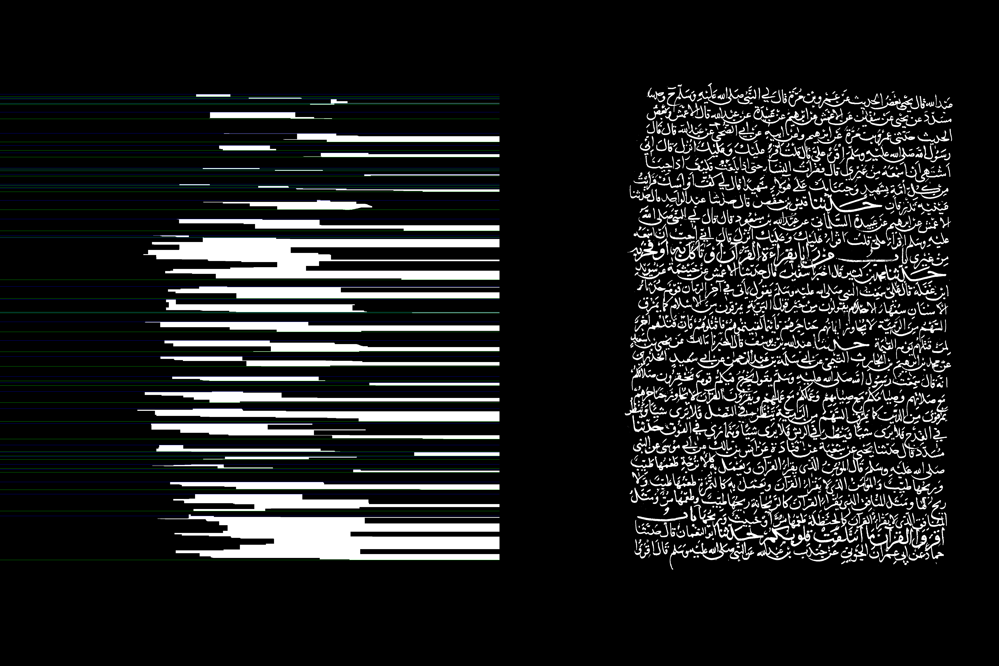

In [ ]:
image = cv.imread('/content/drive/MyDrive/120 - 2nd Semester/Computer Vision/Project #1/Dataset/ahte_dataset/ahte_test_binary_images/moc_test_10.png', cv.IMREAD_GRAYSCALE)

ret, image = cv.threshold(image, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)

#Hor Closing
kernel = np.ones((1, 20), np.uint8)
closed = cv.morphologyEx(image, cv.MORPH_CLOSE, kernel, iterations = 10)

# cv2_imshow(closed)

kernel = np.ones((3, 1), np.uint8)
eruded = cv.erode(image, kernel, iterations=6) 
# cv2_imshow(eruded)

kernel = np.ones((3, 3), np.uint8)
opening = cv.morphologyEx(image, cv.MORPH_OPEN, kernel, iterations=4)
# cv2_imshow(opening)

width = int(opening.shape[1]/2)


kernel = np.ones((3, width), np.uint8)
closed = cv.morphologyEx(opening, cv.MORPH_CLOSE, kernel, iterations = 1)


kernel = np.ones((5, 5), np.uint8)
eruded = cv.erode(closed, kernel, iterations=6) 
# cv2_imshow(eruded)


# cv2_imshow(closed)


## (1) read
th, closed = cv.threshold(eruded, 127, 255, cv.THRESH_BINARY_INV|cv.THRESH_OTSU)

gray = closed.copy()
img = gray.copy()


## (2) threshold
th, threshed = cv.threshold(gray, 127, 255, cv.THRESH_BINARY_INV|cv.THRESH_OTSU)

## (3) minAreaRect on the nozeros
pts = cv.findNonZero(threshed)
ret = cv.minAreaRect(pts)

(cx,cy), (w,h), ang = ret
if w>h:
    w,h = h,w
    ang += 90

## (4) Find rotated matrix, do rotation
M = cv.getRotationMatrix2D((cx,cy), ang, 1.0)
rotated = cv.warpAffine(threshed, M, (img.shape[1], img.shape[0]))

## (5) find and draw the upper and lower boundary of each lines
hist = cv.reduce(rotated,1, cv.REDUCE_AVG).reshape(-1)

th = 2
H,W = img.shape[:2]
uppers = [y for y in range(H-1) if hist[y]<=th and hist[y+1]>th]
lowers = [y for y in range(H-1) if hist[y]>th and hist[y+1]<=th]

rotated = cv.cvtColor(rotated, cv.COLOR_GRAY2BGR)
for y in uppers:
    cv.line(rotated, (0,y), (W, y), (255,0,0), 1)

for y in lowers:
    cv.line(rotated, (0,y), (W, y), (0,255,0), 1)

# cv2_imshow(rotated)
# cv2.imwrite("result.png", rotated)
# cv2_imshow(image)


print(len(uppers))
print(len(lowers))

image = cv.cvtColor(image, cv.COLOR_GRAY2BGR)


final_frame = cv.hconcat((rotated, image))
cv2_imshow(final_frame)


In [ ]:
# import the necessary libraries
!pip install scikit-image==0.15
from skimage import transform
from skimage import filters
import cv2
import skimage.transform as transform
# read the input image
img = image.copy()

# convert image from BGR
# to GRAY scale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# filter out the gradient representation
# image to further process for
# seam carving algorithm
# filters.sobel() is used to
# find edges in an image
filtered = filters.sobel(gray.astype("float"))


for i in range(20, 180, 20):
	
	# apply seam carve to the image,
	# iterating over the image for
	# multiple frames
	# transform.seam_carve() can transform
	# the seam of image vertically as
	# well as horizontally
  
	carved_image = transform.seam_carve(img,
										filtered,
										'vertical',
										i)

# show the original image
cv2.imshow("original", img)

# show the carved image
cv2.imshow("carved", carved_image)

# print shape of both images
print("Shape of original image ",
	img.shape)
print("Shape of Carved image ",
	carved_image.shape)

# wait
cv2.waitKey(0)


     |████████████████████████████████| 26.3MB 164kB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: scikit-image 0.14.0
    Uninstalling scikit-image-0.14.0:
      Successfully uninstalled scikit-image-0.14.0


ImportError: ignored

In [ ]:
!pip install seam-carving


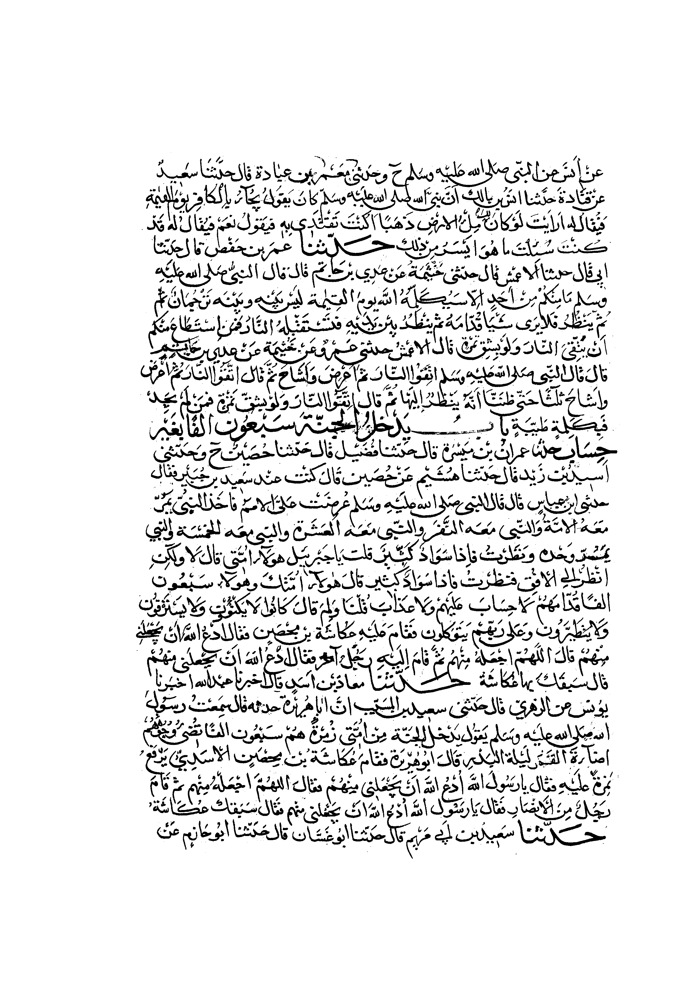

In [ ]:

import numpy as np
from PIL import Image
import seam_carving
import cv2 as cv
from google.colab.patches import cv2_imshow


image = cv.imread('/content/drive/MyDrive/120 - 2nd Semester/Computer Vision/Project #1/Dataset/ahte_dataset/ahte_test_binary_images/book1_page11.png', cv.IMREAD_GRAYSCALE)

# src = np.array(Image.open('/content/drive/MyDrive/120 - 2nd Semester/Computer Vision/Project #1/Dataset/ahte_dataset/ahte_test_binary_images/book1_page11.png'))
src = image.copy()
src_h, src_w = src.shape

dst = seam_carving.resize(
    src, (src_w - 200, src_h),
    energy_mode='forward',   # Choose from {backward, forward}
    order='height-first',  # Choose from {width-first, height-first}
    keep_mask=None
)
Image.fromarray(dst).show()
cv2_imshow(dst)


Seam Carrving

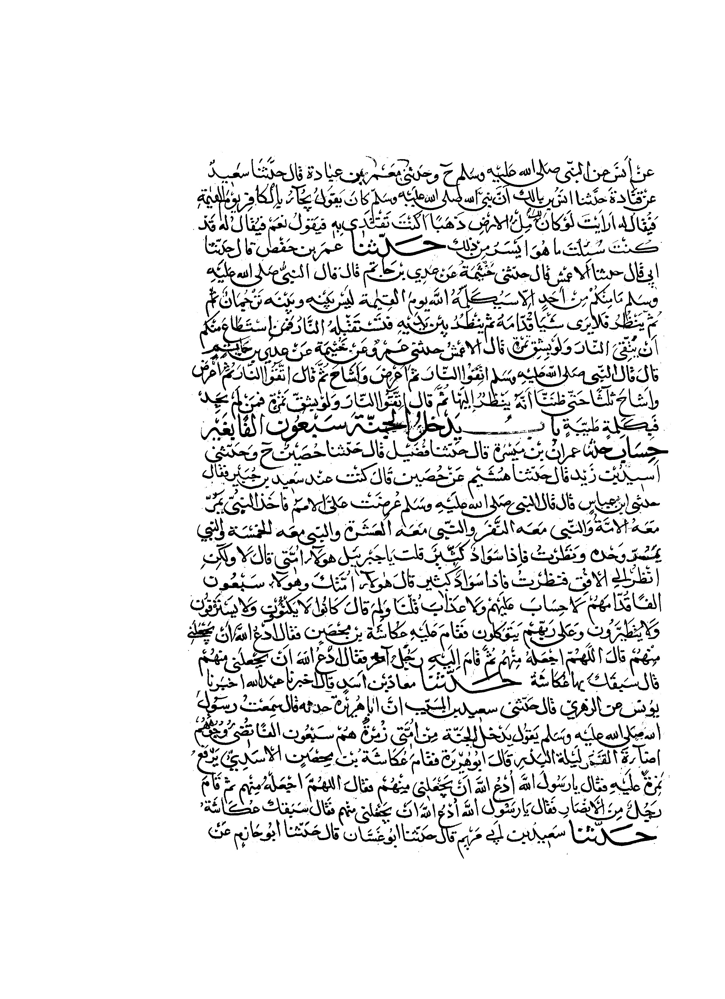

TypeError: ignored

In [ ]:
import numpy as np
import cv2
import imutils
import sys


def resize_image(input_image_path, output_height, output_width):
    #read image and convert to float 64 for manipulation
    input_image = cv2.imread(input_image_path).astype(np.uint8)
    #get height and width to compare to new size
    old_height, old_width = input_image.shape[: 2]
    #get total change in rows and columns so we know how to resize
    delta_col, delta_row = output_width - old_width, output_height - old_height
    if np.absolute(delta_row) > 0:
        #rotate image i necesssary
        input_image = rotate_image(input_image, 90)
        delta_col = delta_row
    #for use later
    cv2.imwrite('images/output/seams/seam_overlay.png', input_image)
    #create a copy of original to manipulate for our output image
    output_image = np.copy(input_image)
    #get energy map of image
    energy_map = generate_energy_map(output_image)
    #apply color map to create transport
    color_img = cv2.applyColorMap(energy_map, cv2.COLORMAP_JET)
    #save color map image
    cv2.imwrite('images/output/maps/energy_color.png', color_img)
    #optional, print energy map
    cv2.imwrite('images/output/maps/energy_map.png', energy_map)
    output_image_name = ''
    #if necessary to vertical cut, do so
    if delta_col > 0:
        output_image_name = 'expanded_' + str(output_width) + '_final'
        #our intial image that we will now expand
        expanded_image = np.copy(input_image)
        total_seams = []
        for dummy in range(delta_col):
            #traverse through rows to find minimum values
            seam = find_seam(output_image, energy_map)     
            #write seam to overlay image
            write_seam(seam, 'images/output/seams/seam_overlay.png')
            #add seam to our seams array
            total_seams.append(seam)
            #delete the seam to find the next one minimum
            output_image = delete_seam(output_image, seam)
            #calculate new energy map of image
            energy_map = generate_energy_map(output_image)
        num_seams = len(total_seams)
        #overwire our expanded image
        expanded_image = np.copy(input_image)
        for dummy in range(num_seams):
            seam = total_seams.pop(0)
            expanded_image = insert_seam(seam, expanded_image)
            total_seams = update_seams(total_seams, seam)
        #revert if we rotated
        if np.absolute(delta_row) > 0:
            expanded_image= rotate_image(expanded_image, -90)
        save_final_img(expanded_image, output_image_name) 
    else:
        output_image_name = 'reduced_' + str(output_width) + '_final'
        #case for needing to remove columns (make image narrower)
        delta_col = np.absolute(delta_col)
        #iterate through and remove seams of low energy pixels
        for dummy in range(delta_col):
            #traverse through rows to find minimum values
            seam = find_seam(output_image, energy_map)
            #write seam to overaly image
            write_seam(seam, 'images/output/seams/seam_overlay.png')
            #delete the seam to find the next one
            output_image = delete_seam(output_image, seam)
            energy_map = generate_energy_map(output_image)
        #revert if we rotated
        if np.absolute(delta_row) > 0:
            output_image = rotate_image(output_image, 270)
        save_final_img(output_image, output_image_name)
    return output_image

def rotate_image(image, angle):
	rotated = imutils.rotate_bound(image, angle)
	return rotated

def find_seam(img, energy_map):
    #get the size of our current image
    rows, cols = img.shape[:2]
    #create a seam that has the height of the image but is empty
    seam = np.zeros(img.shape[0]) 
    distance = np.zeros(img.shape[:2]) + sys.maxint
    distance[0,:] = np.zeros(img.shape[1])
    edge = np.zeros(img.shape[:2])
    for row in range(rows-1):
        for col in range(cols):
            #apply the energy formulat here
            #M(i, j) = e(i, j) + min(M(i-1, j-1), M(i-1, j), M(i-1, j + 1))
            #not first row
            if col != 0:
                #caclue the column behind
                first = distance[row+1, col-1]
                prev = distance[row, col] + energy_map[row+1, col-1]
                #set to minimum of the two
                distance[row + 1, col - 1] = min(first, prev)
                #we are on the edge
                if first > prev:
                    edge[row+1, col-1] = 1
            #calcualte the existing column 
            second = distance[row+1, col]
            current = distance[row, col] + energy_map[row+1, col]
            #set to minimum of the two
            distance[row + 1, col] = min(second, current)
            if second > current:
                #not on the edge
                edge[row+1, col] = 0
            #not next to edge
            if col != cols-1:
                third = distance[row+1, col+1]
                next = distance[row, col] + energy_map[row+1, col+1]
                distance[row+1, col+1]  = min(third, next)
                if third > next:
                    edge[row+1, col+1] = -1

    # Retrace the min-path and update the 'seam' vector
    seam[rows-1] = np.argmin(distance[rows-1, :])
    for i in (x for x in reversed(range(rows)) if x > 0):
        seam[i-1] = seam[i] + edge[i, int(seam[i])]
    #we found our optimal seam
    return seam

def insert_seam(seam, img):
    rows, cols = img.shape[:2]
    #zeros
    zeros = np.zeros((rows,1,3), dtype=np.uint8)
    #updated image with additional pixels
    img_extended = np.hstack((img, zeros))
    for row in range(rows):
        #find where seam should be sinerted
        for col in range(cols, int(seam[row]), -1):
            img_extended[row, col] = img[row, col-1]
        #insert the average of its two neighbors
        for i in range(3):
            v1 = img_extended[row, int(seam[row])-1, i]
            v2 = img_extended[row, int(seam[row])+1, i]
            #calculate the average and set equal to the values
            img_extended[row, int(seam[row]), i] = (int(v1)+int(v2))/2
    return img_extended

def delete_seam(image, seam):
    rows, cols = image.shape[:2]
    #remove seam from image and adjust all other cols
    for row in range(rows):
        #remove seam from imae and move over all other cols
        for col in range(int(seam[row]), cols-1):
            image[row, col] = image[row, col+1]
    small_image = image[:, 0:cols-1]
    return small_image

def save_final_img(img, name):
    cv2.imwrite('images/output/final/' + name + '_output.png', img.astype(np.uint8))

def update_seams(remaining, current):
    seams = []
    #so we know what seams have been used and move over the other ones
    for seam in remaining:
        #move over seam by 2 pixels 
        seam[np.where(seam >= current)] += 2
        #return updated seams list wit updated location
        seams.append(seam)
    return seams

#show the line of the seam discovered on the picture
def write_seam(seam, img_path):
    #get existing image that has previous written seams
    img = cv2.imread(img_path)
    seam_img = np.copy(img) 
    x_coords, y_coords = np.transpose([(i,int(j)) for i,j in enumerate(seam)])
    #make the seam red
    seam_img[x_coords, y_coords] = (0,0,255)
    #save to image so we can see seams
    cv2.imwrite(img_path, seam_img)
    return seam_img

def generate_energy_map(img):
    # optinoally apply blur
    img = cv2.GaussianBlur(img,(3,3),0).astype(np.int8)
    #turn in into gray to generate x and y gradients
    gray = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2GRAY)
    #gradient x
    sobel_x = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=3)
    #gradient 7
    sobel_y = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=3)
    #abs value of x
    abs_sobel_x = cv2.convertScaleAbs(sobel_x)
    #abs value of y
    abs_sobel_y = cv2.convertScaleAbs(sobel_y)
    #merged energy map
    energy_map = cv2.addWeighted(abs_sobel_x, 0.5, abs_sobel_y, 0.5, 0)
    return energy_map

#main function
if __name__ == '__main__':
    # image_input = raw_input("Name of original image: ")
    # path = 'images/src/' + image_input
    # img = cv2.imread(path)
    img = cv2.imread('/content/drive/MyDrive/120 - 2nd Semester/Computer Vision/Project #1/Dataset/ahte_dataset/ahte_test_binary_images/book1_page11.png', cv.IMREAD_GRAYSCALE)
    cv2_imshow(img)
    print("Hello")
    # print('Current dimensions (HxW): ')
    # print(img.shape[0])
    # output_height = raw_input("Resize height to: ")
    # output_width = raw_input("Resize width to: ")
    #resize image
    # resize_image(path, int(output_height), int(output_width))
    print('Done - output displayed in output folder.')

# Latest Working Code - Wednesday

read  data 

In [ ]:
from google.colab import drive
import cv2 as cv
import cv2
import numpy as np
from PIL import Image
from google.colab.patches import cv2_imshow
drive.mount('/content/drive')
# drive.flush_and_unmount()
# image = cv.imread('/content/drive/MyDrive/Dataset/ahte_dataset/ahte_test_binary_images/book1_page11.png', cv.IMREAD_GRAYSCALE)

# FILE_NAME = '/content/drive/MyDrive/120 - 2nd Semester/Computer Vision/Project #1/Dataset/ahte_dataset/ahte_test_binary_images/moc_test_10.png'
FILE_NAME = '/content/drive/MyDrive/Dataset/ahte_dataset/ahte_test_binary_images/moc_train_3.png'
img = cv.imread(FILE_NAME, cv.IMREAD_GRAYSCALE)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


threshold method

In [ ]:
def threshold(img, inv=False):
  mode = cv.THRESH_BINARY
  if inv:
    mode = cv.THRESH_BINARY_INV

  return cv.threshold(img, 0, 255,  mode + cv.THRESH_OTSU)[-1]

skew

In [ ]:
def fix_skew(thresh):
  pts = cv.findNonZero(thresh)
  ret = cv.minAreaRect(pts)
  
  (cx,cy), (w,h), ang = ret
  if w>h:
      w,h = h,w
      ang += 90
  
  M = cv.getRotationMatrix2D((cx,cy), ang, 1.0)
  return cv.warpAffine(thresh, M, (thresh.shape[1], thresh.shape[0]))

thresholding 

In [ ]:
# Binarization
thresh = threshold(img, True)
cv2_imshow(thresh)

In [ ]:
# thresh = cv.morphologyEx(thresh, cv.MORPH_GRADIENT, kernel)
# cv2_imshow(gradient)

In [ ]:
# kernel = cv2.getStructuringElement(cv2.MORPH_CROSS,(1,2))
# gradient = cv.morphologyEx(img, cv.MORPH_GRADIENT, kernel)
# cv2_imshow(gradient)
# cany = cv.Canny(img,0,255)
# cv2_imshow(cany)
# # kernel = np.ones((4, 5))
# kernel = cv2.getStructuringElement(cv2.MORPH_CROSS,(5,5))
# thresh = cv.morphologyEx(img, cv.MORPH_OPEN, kernel)
# cv2_imshow(thresh)

# t = threshold(cany)
# cv2_imshow(t)



erosion 

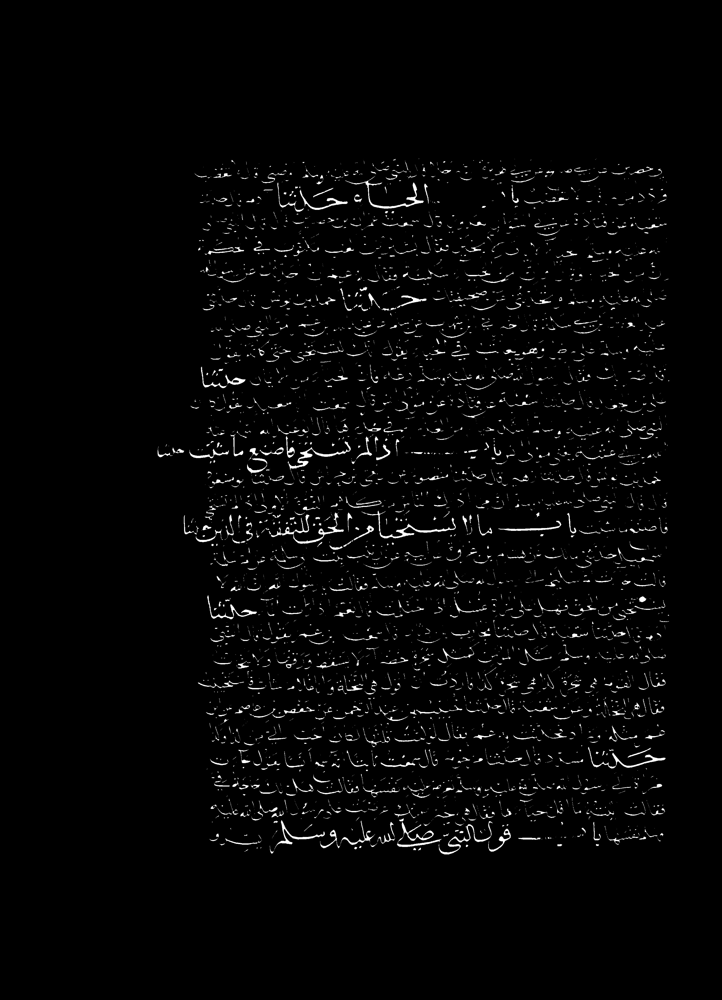

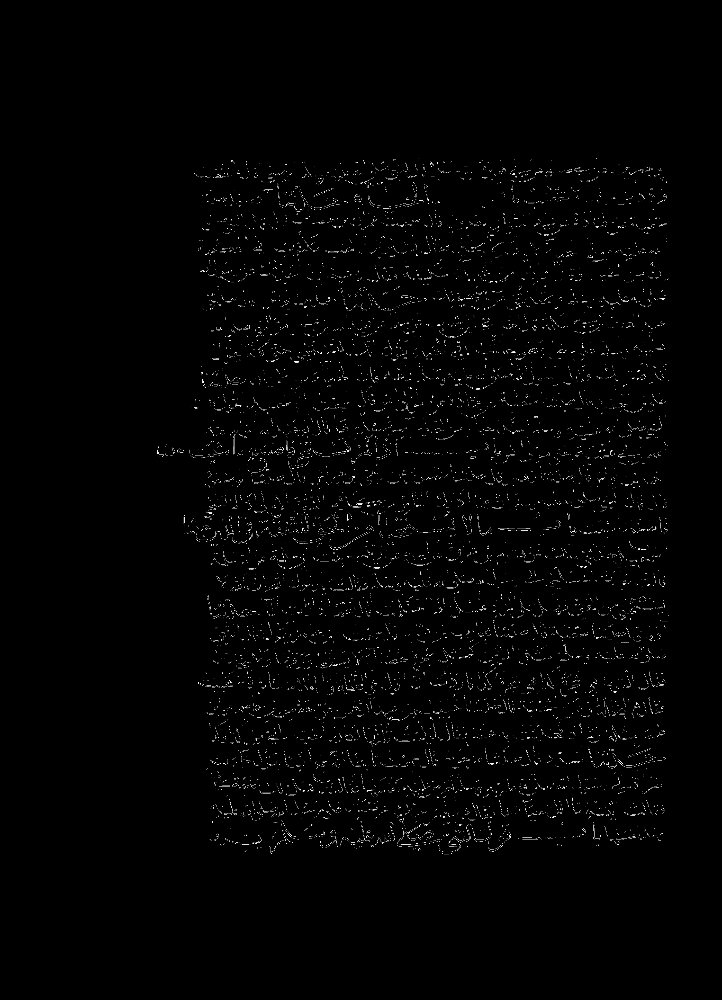

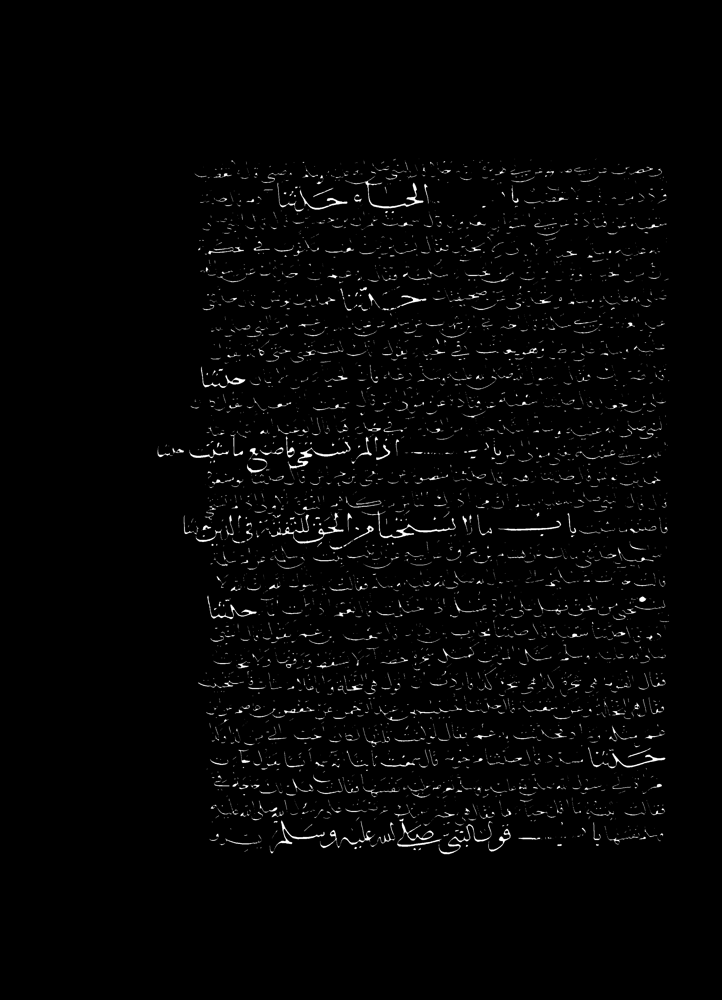

In [ ]:
# Erosion
# thresh = threshold(img, True)
# thresh = img 
kernel = np.ones((5, 5))

er = cv.erode(thresh, kernel, iterations = 1)
# thresh = cv.erode(thresh, kernel, iterations = 1)


# kernel = np.ones((2, 2))
# opening = cv2.morphologyEx(thresh, cv.MORPH_OPEN, kernel)
cv2_imshow(er)

cany = cv.Canny(er,0,255)
cv2_imshow(cany)

cv2_imshow(er-cany)
thresh =er-cany
# e_and_o = cv.hconcat((thresh, opening))
# cv2_imshow(e_and_o)


smothing 

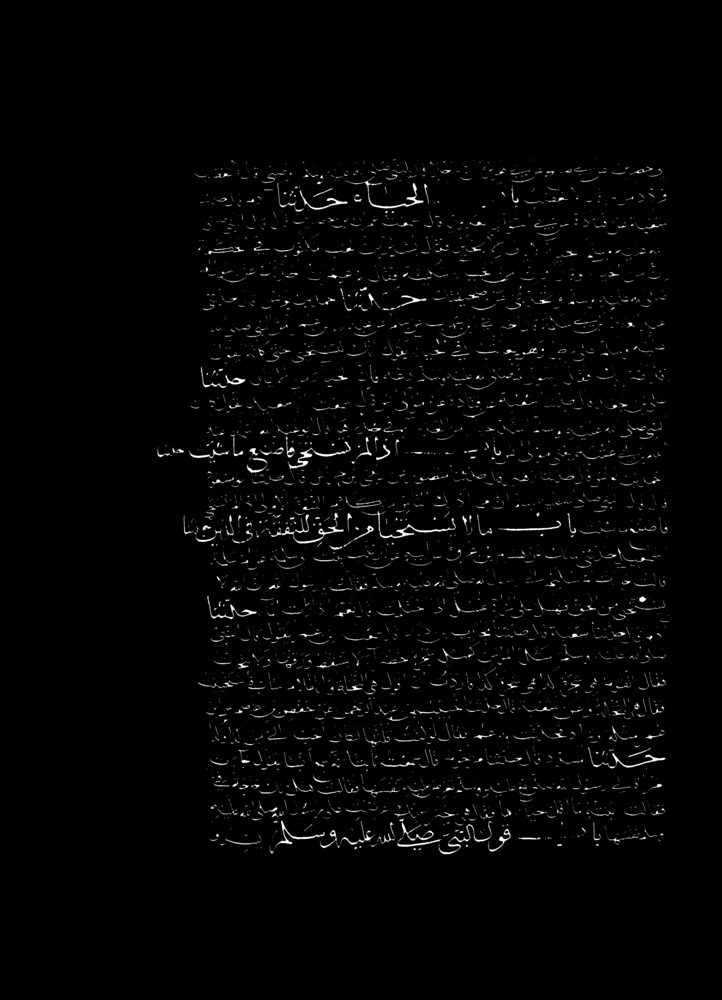

In [ ]:
# Smoothing
thresh = cv.GaussianBlur(thresh, (5, 5), 0)
cv2_imshow(thresh)

horizantal projection 

In [ ]:
# Horizontal Projection
hp = cv.reduce(thresh, 1, cv.REDUCE_AVG).reshape(-1)
# cv2_imshow(hp)

extact lines

28


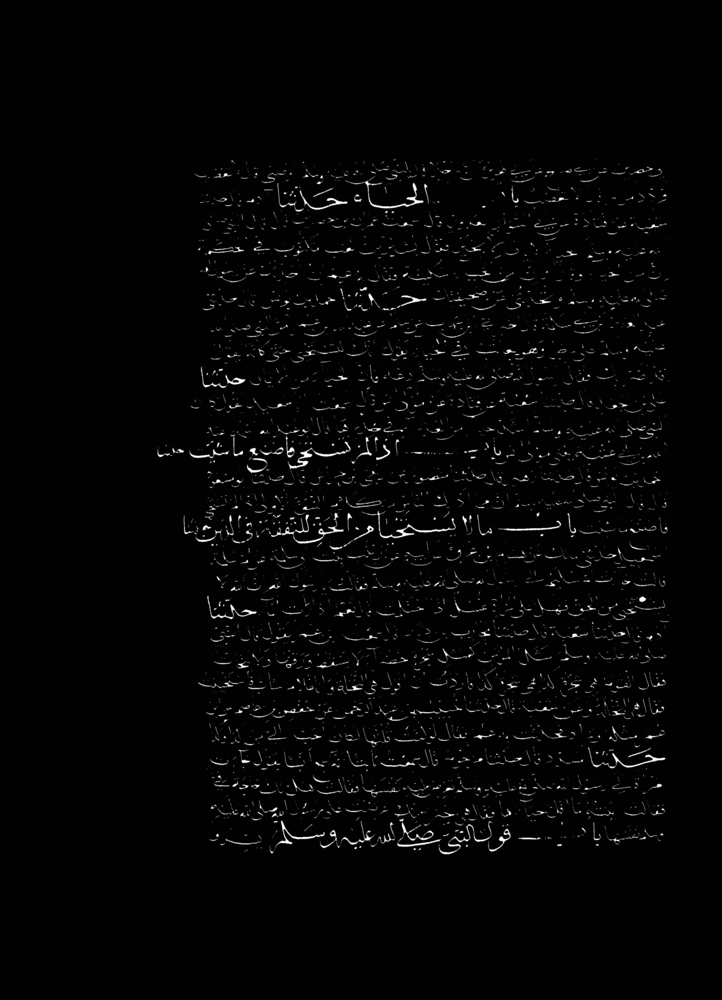

In [ ]:
# Exctract upper and lower bounds of connected lines of the document
th = 2
H,W = thresh.shape[:2]
uppers = [y for y in range(H-1) if hp[y]<=th and hp[y+1]>th]
lowers = [y for y in range(H-1) if hp[y]>th and hp[y+1]<=th]

# Compute lines' heights
lh = [lowers[i] - uppers[i] for i in range(len(lowers))]

# Extract lines with very small heights (i.e.: diacritical lines)
q1 = np.average(lh) / 3
small = [i for i in range(len(lh)) if lh[i] <= q1]

# Filter out small lines
for i in range(len(small)):
  uppers.pop(small[i] - i)
  lowers.pop(small[i] - i)

# Compute lines' heights again without the small lines
lh = [lowers[i] - uppers[i] for i in range(len(lowers))]

# Extract lines with very large heights (i.e.: two connected lines)
q3 = int(np.average(lh) * 1.8)
big = [i for i in range(len(lh)) if lh[i] >= q3]

# Separate large lines into two
for i in range(len(big)):
  mid = uppers[big[i]] + int((lowers[big[i]] - uppers[big[i]]) / 2)
  uppers.append(mid - 2)
  lowers.append(mid + 2)

print(len(uppers))

colored = cv.cvtColor(thresh, cv.COLOR_GRAY2BGR)
for y in uppers:
    cv.line(colored, (0,y), (W, y), (255,0,0), 1)

for y in lowers:
    cv.line(colored, (0,y), (W, y), (0,255,0), 1)

thresh2 = cv.cvtColor(thresh, cv.COLOR_GRAY2BGR)
cv2_imshow(thresh2)



compare 

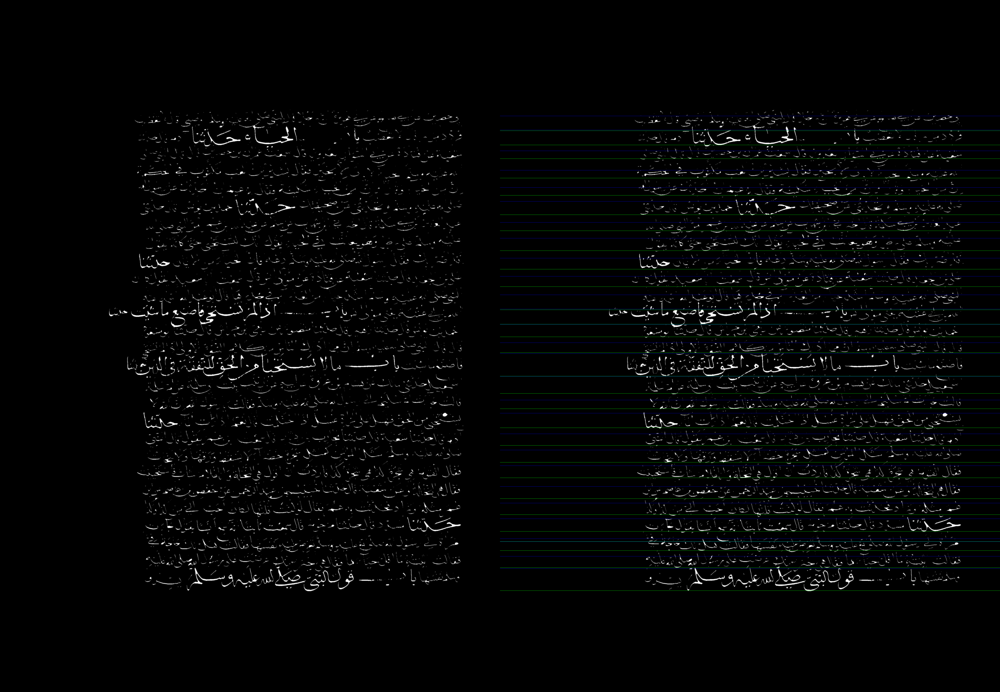

In [ ]:
himg = cv.hconcat((thresh2, colored))
cv2_imshow(himg)

In [ ]:
# # Binarization
# thresh = threshold(img, True)

# # Erosion
# kernel = np.ones((5, 5))
# thresh = cv.erode(thresh, kernel, iterations = 1)

# # Smoothing
# thresh = cv.GaussianBlur(thresh, (5, 5), 0)

# # Horizontal Projection
# hp = cv.reduce(thresh, 1, cv.REDUCE_AVG).reshape(-1)

# # Exctract upper and lower bounds of connected lines of the document
# th = 2
# H,W = thresh.shape[:2]
# uppers = [y for y in range(H-1) if hp[y]<=th and hp[y+1]>th]
# lowers = [y for y in range(H-1) if hp[y]>th and hp[y+1]<=th]

# # Compute lines' heights
# lh = [lowers[i] - uppers[i] for i in range(len(lowers))]

# # Extract lines with very small heights (i.e.: diacritical lines)
# q1 = np.average(lh) / 3
# small = [i for i in range(len(lh)) if lh[i] <= q1]

# # Filter out small lines
# for i in range(len(small)):
#   uppers.pop(small[i] - i)
#   lowers.pop(small[i] - i)

# # Compute lines' heights again without the small lines
# lh = [lowers[i] - uppers[i] for i in range(len(lowers))]

# # Extract lines with very large heights (i.e.: two connected lines)
# q3 = int(np.average(lh) * 1.8)
# big = [i for i in range(len(lh)) if lh[i] >= q3]

# # Separate large lines into two
# for i in range(len(big)):
#   mid = uppers[big[i]] + int((lowers[big[i]] - uppers[big[i]]) / 2)
#   uppers.append(mid - 2)
#   lowers.append(mid + 2)

# print(len(uppers))

# colored = cv.cvtColor(thresh, cv.COLOR_GRAY2BGR)
# for y in uppers:
#     cv.line(colored, (0,y), (W, y), (255,0,0), 1)

# for y in lowers:
#     cv.line(colored, (0,y), (W, y), (0,255,0), 1)

# thresh2 = cv.cvtColor(thresh, cv.COLOR_GRAY2BGR)

# himg = cv.hconcat((thresh2, colored))
# cv2_imshow(himg)

# test smth 


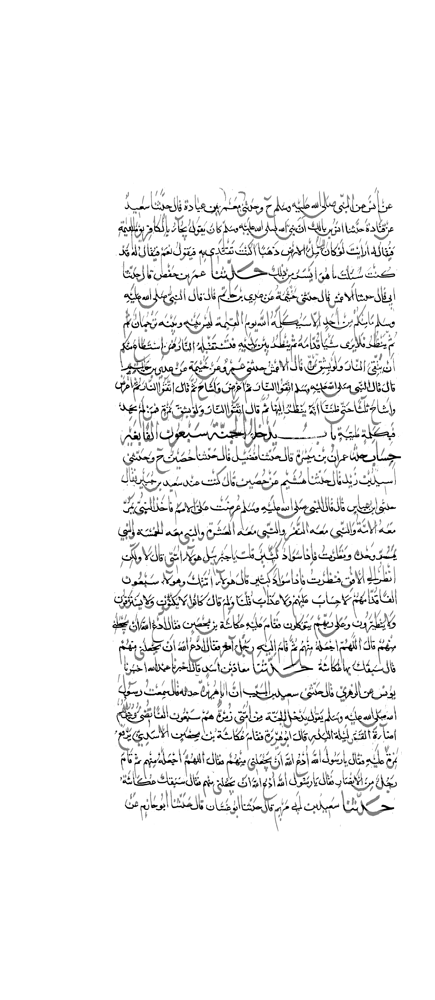

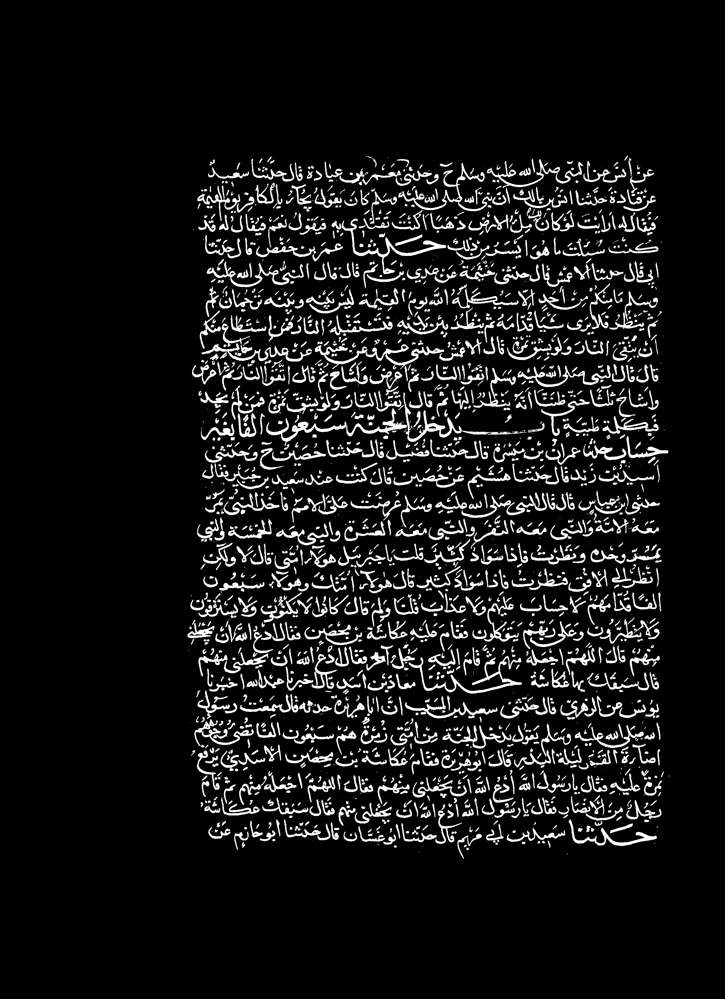

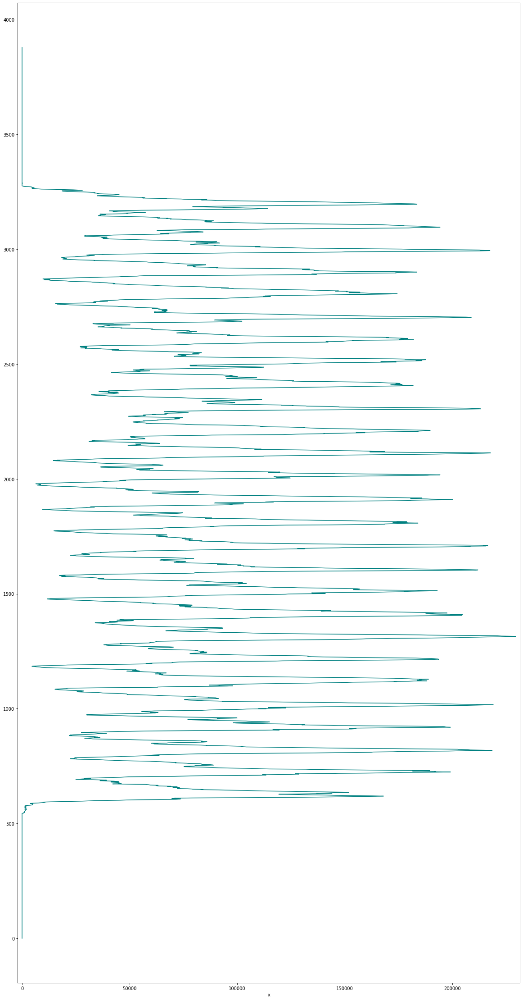

In [ ]:

import cv2
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd


# Load image, grayscale, Otsu's threshold
# FILE_NAME = '/content/drive/MyDrive/Dataset/ahte_dataset/ahte_test_binary_images/moc_test_10.png'
FILE_NAME = '/content/drive/MyDrive/120 - 2nd Semester/Computer Vision/Project #1/Dataset/ahte_dataset/ahte_test_binary_images/book1_page11.png'
image = cv.imread(FILE_NAME)
h, w = image.shape[:2]
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# Sum white pixels in each row
# Create blank space array and and final image 
pixels = np.sum(thresh, axis=1).tolist()
space = np.ones((1, w), dtype=np.uint8) * 255
result = np.zeros((0, w), dtype=np.uint8)

# Iterate through each row and add space if entire row is empty
# otherwise add original section of image to final image
for index, value in enumerate(pixels):
    if value <80000:
        result = np.concatenate((result, space), axis=0)
    row = gray[index:index+1, 0:w]
    result = np.concatenate((result, row), axis=0)

#  plot visualization
x = range(len(pixels))[::-1]
df = pd.DataFrame({'y': x, 'x': pixels})
df.plot(x='x', y='y', xlim=(-2000,max(pixels) + 2000), legend=None, color='teal',figsize=(20,40))

# result = cv.threshold(result,0,255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

cv2_imshow( result)
cv2_imshow(thresh)
# himg = cv.hconcat((thresh, result))
# cv2_imshow(himg)
plt.show()


In [ ]:
import skimage.transform
from skimage import filters
import cv2
FILE_NAME = '/content/drive/MyDrive/Dataset/ahte_dataset/ahte_test_binary_images/moc_test_10.png'
image = cv.imread(FILE_NAME)
# convert image from BGR
# to GRAY scale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  
# filter out the gradient representation 
# image to further process for 
# seam carving algorithm
# filters.sobel() is used to 
# find edges in an image
filtered = filters.sobel(gray.astype("float"))
  
  
for i in range(20, 180, 20):
    
    # apply seam carve to the image, 
    # iterating over the image for
    # multiple frames
    # transform.seam_carve() can transform 
    # the  seam of image vertically as
    # well as horizontally
    carved_image = skimage.transform.seam_carve(img,
                                        filtered, 
                                        'vertical',
                                        i)
  
# show the original image
cv2_imshow(img)
  
# show the carved image
cv2_imshow(carved_image)
  
# print shape of both images
print("Shape of original image ",
      img.shape)
print("Shape of Carved image ",
      carved_image.shape)
  
# wait 
# cv2.waitKey(0)

AttributeError: ignored